In [1]:
import pandas as pd
import numpy as np
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn import preprocessing
from sklearn.externals.six import StringIO  
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus
from sklearn.metrics import confusion_matrix
from sklearn import tree
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import roc_auc_score
from sklearn.linear_model import LogisticRegression
from sklearn import ensemble
from sklearn.ensemble import RandomForestClassifier
from sklearn.datasets import make_classification
import matplotlib.pyplot as plt
from operator import itemgetter  

In [6]:
correlations = pd.read_csv('../calculated_correlation/correlation_current.csv')
correlations = correlations.drop('Unnamed: 0',axis=1)

In [5]:
fpd = pd.read_csv('../dataframe_creation/complete_dataframe.csv',index_col=0, parse_dates=True)
fpd = fpd.fillna(1)

In [3]:
sel = ['K302','K173','K414','K158','K402','K305']

In [4]:
def plot_scores(auc,f1,prec,title):
    # set width of bar
    barWidth = 0.25

    # Set position of bar on X axis
    r1 = np.arange(len(auc))
    r2 = [x + barWidth for x in r1]
    r3 = [x + barWidth for x in r2]

    # Make the plot
    plt.figure(figsize=(15,10))
    plt.title(title)
    plt.bar(r1, auc, color='#7f6d5f', width=barWidth, edgecolor='white', label='auc')
    plt.bar(r2, f1, color='#557f2d', width=barWidth, edgecolor='white', label='f1')
    plt.bar(r3, prec, color='#2d7f5e', width=barWidth, edgecolor='white', label='prec')

    # Add xticks on the middle of the group bars
    plt.xlabel('Location', fontweight='bold')
    plt.xticks([r + barWidth for r in range(len(auc))], ints)
    # Create legend & Show graphic

    plt.legend()
    plt.show()
    return

In [177]:
def predictor(data,intersections,predictor,k,features):
    predictors = {}
    performance = {}
    confusion_matrices = {}
    used_features = {}
    importances = {}
    sel = ['K302','K173','K414','K158','K402','K305']
    
    for label in intersections:
        try:
            feats = features[label]
        except:
            return [predictors,performance,confusion_matrices,used_features,importances]
        print('\nLabel: ',label)
        df = data.copy(deep=True)
        df = df[feats]
        y = df[label][2:] #set label to be current intersection
        
        boundary = y.sort_values().head(k)[-1]#Get K lowest LOF score and use as boundary 
        print('Boundary is set to: ',boundary)
        y = y.apply(make_binary,boundary=boundary)
        
        y,y_test = split_data(y)
        #print('Length of y: ',len(y))

        for feature in intersections: # for each intersection create t-1 & t-2 feature
            if feature in list(df.columns):
                df['t-1'+feature] = df[feature].shift(periods=1)
                df['t-2'+feature] = df[feature].shift(periods=2)
                #df['t-3'+feature] = df[feature].shift(periods=3)
                #df['t-4'+feature] = df[feature].shift(periods=4)
                df = df.drop(feature,axis=1) #Then, drop the original column
            else:
                pass
        
        if label in sel:
            X = df[2:]
            X,X_test = split_data(X)
            #print('Length of X: ',len(X))

            used_features[label] = X.columns

            #Create predictor and get best hyperparameters with grid search
            if predictor == 'rf':
                model = rf_grid_search(X,y)

            
            #Test model performance and print results
            y_pred = model.predict(X_test)
            try:
                auc = roc_auc_score(y_test, y_pred)
                accuracy = metrics.accuracy_score(y_test, y_pred)
                f1 = metrics.f1_score(y_test, y_pred)
                precision = metrics.precision_score(y_test, y_pred)

                print('\nPrediction results: ')
                print('Area under the ROC curve: ',auc)
            except:
                print('!!!Error here when runnig AUC!!!')
            print("Accuracy:",accuracy)
            print("f1:",f1)
            print("Precision:",precision)
            print("Recall:",metrics.recall_score(y_test, y_pred))
            try:
                tn,fp,fn,tp = confusion_matrix(y_test, y_pred).ravel()
                print('tn',tn, 'fp',fp, 'fn',fn, 'tp',tp)

                predictors[label] = model
                performance[label] = auc,accuracy,f1,precision
                confusion_matrices[label] = list(confusion_matrix(y_test, y_pred).ravel())
                importances[label] = model.feature_importances_
                
                #if label == 'K414':
                    
                
            except:
                print('!!!Error in last part!!!')
        else:
            pass
        
    return [predictors,performance,confusion_matrices,used_features,importances]

In [174]:
#Split data into train/val and test based on date
def split_data(df):
    df_test = df['2019-01-01':]
    df = df[:'2018-12-31']
    return df,df_test

#Make the label a binary of outlier or not.
def make_binary(row,boundary):
    if row <= boundary:
        row = 1
    else:
        row = 0
    return row

def rf_grid_search(X,y):
    #param_grid = {'n_estimators': [10,100] }
    rf = RandomForestClassifier(random_state = 1,n_estimators = 100)
    #model = GridSearchCV(rf, param_grid,cv=5, scoring="roc_auc")
    rf.fit(X, y)
    return rf

In [175]:
intersections = [
    'K302','K173','K414','K158','K402','K305',
    'K071','K097','K124','K128','K159','K184','K189','K206','K225','K270','K304','K405','K406','K424','K430','K703','K704','K707','K711','K561','K504','K145','K250',
    'a12in','a12out','n211in','n211out','n141in','n141out','n142in','n142out','n143in','n143out'
]

In [176]:
def feature_selection(treshold,cor_data):
    features = {}
    for i in range(6):
        feature_selection = []
        for (columnName, columnData) in cor_data.loc[i].iteritems():
            if float(columnData) > treshold:
                feature_selection.append(columnName)
            else:
                pass  
        features[sel[i]] = feature_selection
    return features

In [164]:
#features = feature_selection(0.4,correlations)
#a14,a24,a34,a44,feat4 = predictor(fpd,intersections,'rf',50,features)

In [165]:
#features = feature_selection(0.3,correlations)
#a13,a23,a33,a43,feat3 = predictor(fpd,intersections,'rf',50,features)

In [166]:
#features = feature_selection(0.2,correlations)
#a12,a22,a32,a42,feat2 = predictor(fpd,intersections,'rf',50,features)

In [167]:
#features = feature_selection(0.1,correlations)
#a11,a21,a31,a41,feat1 = predictor(fpd,intersections,'rf',50,features)

In [205]:
features = feature_selection(0.05,correlations)
a50 = predictor(fpd,intersections,'rf',50,features)


Label:  K302
Boundary is set to:  0.7306087036925828

Prediction results: 
Area under the ROC curve:  0.75
Accuracy: 0.9985632183908046
f1: 0.6666666666666666
Precision: 1.0
Recall: 0.5
tn 2082 fp 0 fn 3 tp 3

Label:  K173
Boundary is set to:  0.7572706754842946


/Users/wesleyfitters/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no predicted samples.
  'precision', 'predicted', average, warn_for)
/Users/wesleyfitters/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples.
  'precision', 'predicted', average, warn_for)



Prediction results: 
Area under the ROC curve:  0.5
Accuracy: 0.9985632183908046
f1: 0.0
Precision: 0.0
Recall: 0.0
tn 2085 fp 0 fn 3 tp 0

Label:  K414
Boundary is set to:  0.7529919403357282

Prediction results: 
Area under the ROC curve:  0.875
Accuracy: 0.9995210727969349
f1: 0.8571428571428571
Precision: 1.0
Recall: 0.75
tn 2084 fp 0 fn 1 tp 3

Label:  K158
Boundary is set to:  0.8219506026354174

Prediction results: 
Area under the ROC curve:  0.8
Accuracy: 0.9990421455938697
f1: 0.7499999999999999
Precision: 1.0
Recall: 0.6
tn 2083 fp 0 fn 2 tp 3

Label:  K402
Boundary is set to:  0.8048306217374189

Prediction results: 
Area under the ROC curve:  0.875
Accuracy: 0.9995210727969349
f1: 0.8571428571428571
Precision: 1.0
Recall: 0.75
tn 2084 fp 0 fn 1 tp 3

Label:  K305
Boundary is set to:  0.8243633130229433

Prediction results: 
Area under the ROC curve:  0.8
Accuracy: 0.9990421455938697
f1: 0.7499999999999999
Precision: 1.0
Recall: 0.6
tn 2083 fp 0 fn 2 tp 3


In [169]:
#features = feature_selection(0.0,correlations)
#a10,a20,a30,a40,feat0= predictor(fpd,intersections,'rf',50,features)

In [208]:
x=a205
y=a22
ints = x.keys()

auc=[]
acc=[]
f1=[]
prec=[]

for i in ints:
    if i in sel:
        '''
        if i =='K302':
            auc.append(y[i][0])
            acc.append(y[i][1])
            f1.append(y[i][2])
            prec.append(y[i][3])            
        else:'''
        auc.append(x[i][0])
        acc.append(x[i][1])
        f1.append(x[i][2])
        prec.append(x[i][3])
    else: pass

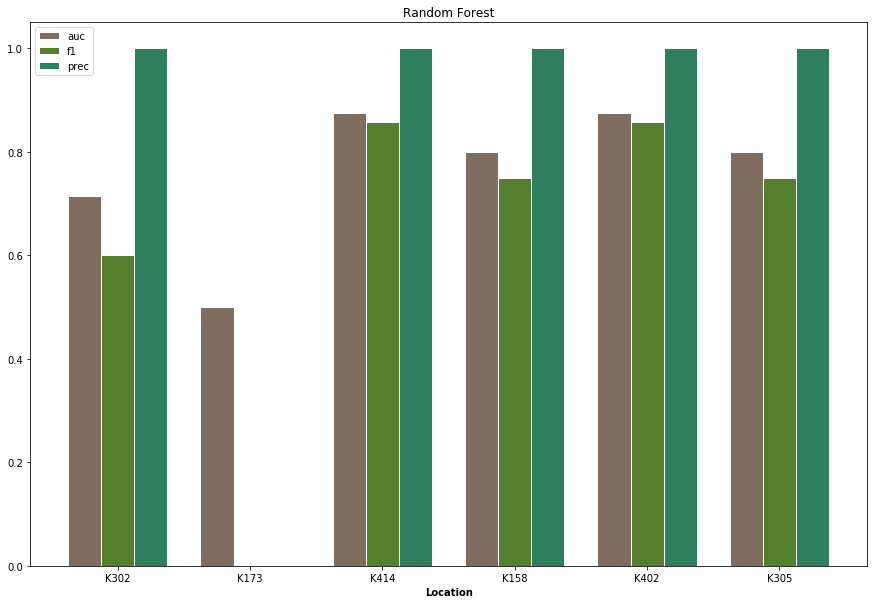

In [212]:
plot_scores(auc,f1,prec,'Random Forest')

# Feature importance

In [38]:
for intersection in sel:
    print('\n',intersection)
    columns = a42[intersection]
    importance = feat2[intersection]

    feature_importance = dict(zip(columns, importance))
    for key, value in sorted(feature_importance.items(), key = itemgetter(1), reverse = True):
        print(key, value)


 K302
t-1K305 0.13021693078792915
t-1K302 0.08793236653613658
t-1K128 0.07347449875791591
t-1K402 0.06647861449968268
t-1K304 0.0480021209826983
t-1K561 0.046655560554433165
t-1K225 0.044244165224438525
t-1K414 0.040031293327417485
t-1K158 0.03826036108264605
t-1K406 0.03633339621859131
t-1K704 0.0361638848843342
t-2K414 0.031285266606220524
t-2K128 0.026595781068248177
t-2K302 0.024716487095233833
t-1a12out 0.024228051678700232
t-2a12in 0.022036010987733615
t-1K206 0.021553496669997063
t-2K304 0.020477940997191964
t-2K305 0.02022610240993529
t-2K406 0.020052744932593295
t-1a12in 0.018550602077297692
other_holidays 0.01802171517589569
t-2K402 0.016364018034982705
t-2K561 0.016194009307203824
t-2K225 0.015720452737868977
t-2K206 0.015092749307045277
t-2a12out 0.015070996383116859
t-2K704 0.012356804921530287
t-2K158 0.0076349568378926815
R 0.004738106440928276
school_holiday 0.0012905134741603669

 K173
t-1K173 0.4167334425888701
t-2K173 0.30001995094093714
t-1K305 0.1658624828027764
t

In [83]:
a43['K302']

Index(['R', 'school_holiday', 'other_holidays', 't-1K302', 't-2K302',
       't-1K414', 't-2K414', 't-1K158', 't-2K158', 't-1K402', 't-2K402',
       't-1K305', 't-2K305', 't-1K128', 't-2K128', 't-1K304', 't-2K304'],
      dtype='object')

In [84]:
feat3['K302']

array([0.00622884, 0.00440892, 0.02642344, 0.12688959, 0.03551937,
       0.08163466, 0.0468842 , 0.06036706, 0.02049445, 0.07328734,
       0.03991226, 0.16815618, 0.03661291, 0.10300864, 0.0502539 ,
       0.07786994, 0.04204829])

## Iterations

In [39]:
sel

['K302', 'K173', 'K414', 'K158', 'K402', 'K305']

In [40]:
xlabs = ['0','0.05','0.1','0.2','0.3','0.4']

In [48]:
def plot_cors(xlabs,sel):
    for i in sel:
        inters = i
        z = []
        z.append(a20[inters][0])
        z.append(a205[inters][0])
        z.append(a21[inters][0])
        z.append(a22[inters][0])
        z.append(a23[inters][0])
        z.append(a24[inters][0])

        plt.figure(figsize=(15,10))
        plt.title(i)
        plt.bar(np.arange(len(z)),z, color='#7f6d5f', edgecolor='white', label='auc')
        plt.xlabel('group', fontweight='bold')
        plt.xticks([r for r in range(len(z))], xlabs)
        plt.show()
    return

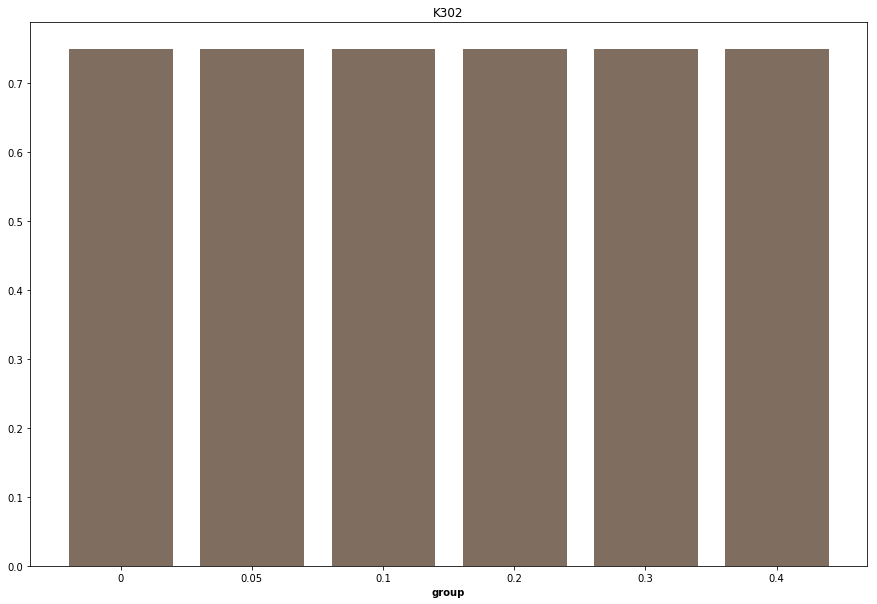

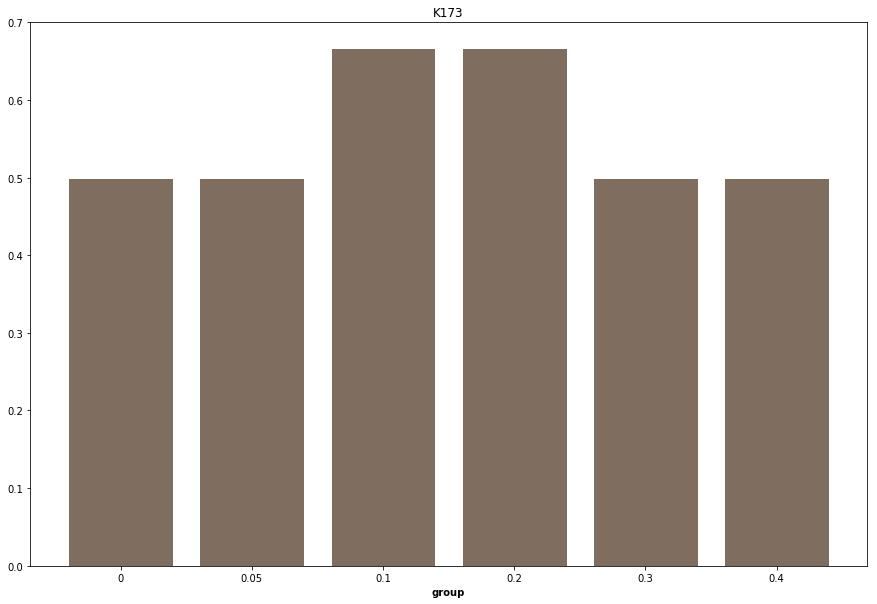

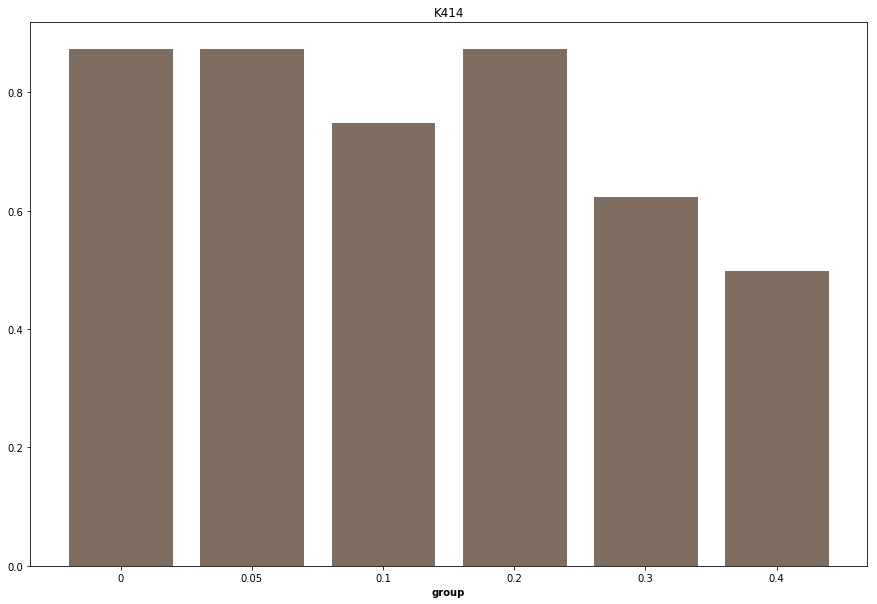

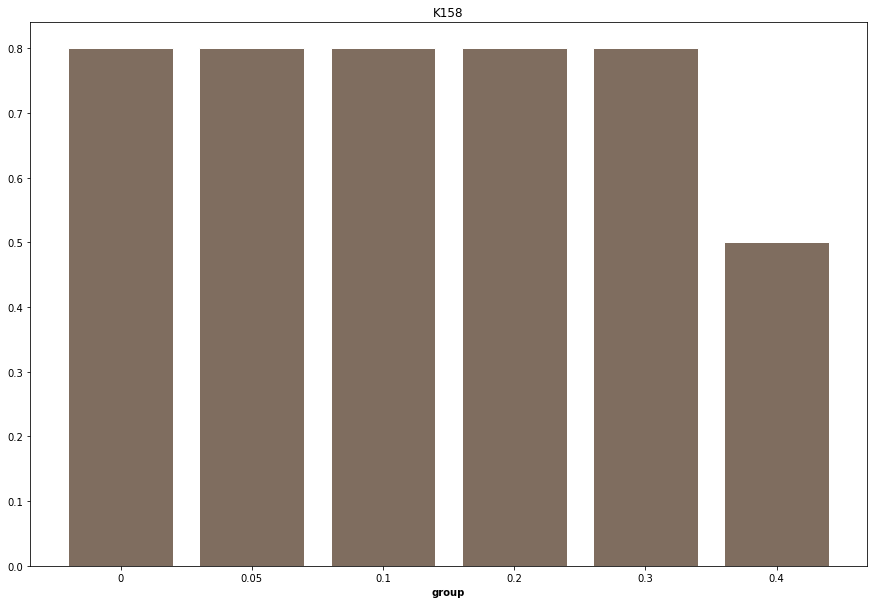

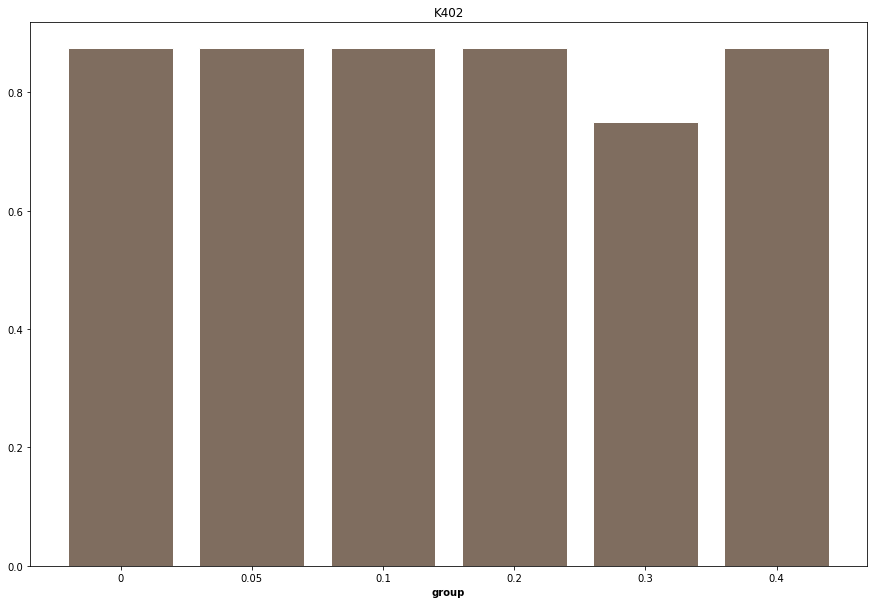

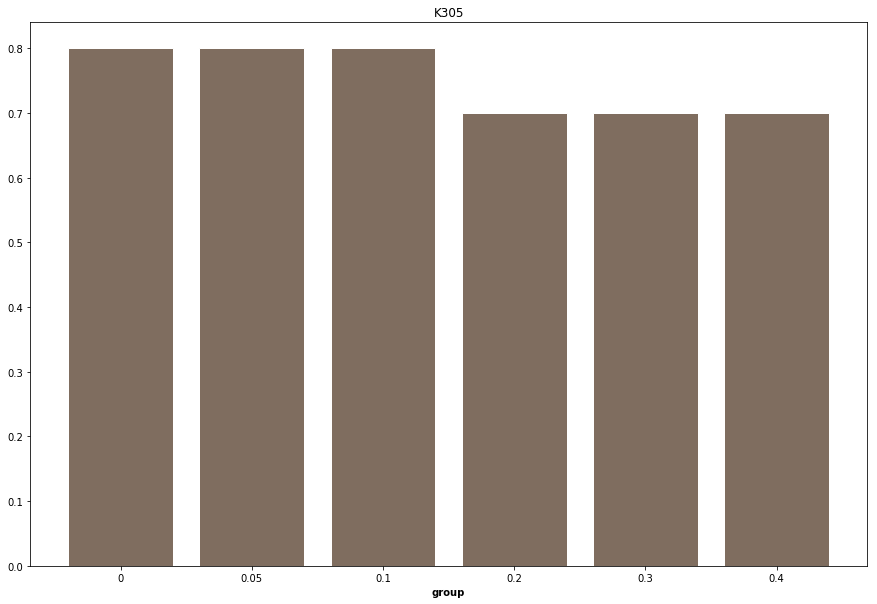

In [49]:
plot_cors(xlabs,sel)

# Visualize dec. tree

In [50]:
from sklearn.tree import export_graphviz

In [58]:
intkey = 'K414'

In [71]:
estimator = a105[intkey].estimators_[5]

In [65]:
feat_names = a405[intkey]

In [75]:
labels = ['0','1']

In [76]:
# Export as dot file
export_graphviz(estimator, out_file='tree.dot', 
                feature_names = feat_names,
                class_names = labels,
                rounded = True, proportion = False, 
                precision = 2, filled = True)

# Convert to png using system command (requires Graphviz)
from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])

# Display in jupyter notebook
from IPython.display import Image
Image(filename = 'tree.png')